# TP 5 - Convolucion

Implementar un aplicativo que levante una imagen en nivel de gris (o que la convierta a YIQ y retenga solo el Y) y aplique el filtrado por convolución aquí visto:

1. Pasabajos: Plano y Bartlett 3x3, 5x5, 7x7. Gaussiano 5x5 y 7x7.
2. Detectores de bordes: Laplaciano v4 y v8. Sobel las 8 orientaciones.
3. Pasabanda, pasaaltos de frecuencia de corte 0,2 y 0,4

Respecto del “cierre” de la imagen cerca de los bordes, implementar la técnica no matemáticamente perfecta de “repetir” artificialmente filas o columnas cuando estas hagan falta. Por ejemplo, si el kernel es 3x3 y estoy en la primera columna, y no hay ninguna columna a la izquierda, entonces repito la primera columna como si estuviese en la imagen original


In [1]:
%reset
%matplotlib inline

# Importamos numpy (libreria de calculo) y le asignamos el nombre "np"
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from scipy import misc


import time

import sys, os
sys.path.insert(0, 'Libreria')

import espacios_color as espc
import suma_y_resta as syr
import OpsHistLum as ophl
import superFT as sft
import conv_2D as C2D



Once deleted, variables cannot be recovered. Proceed (y/[n])? y


# Cargo Imagen

In [2]:
TEST_FOLDER = './Imagenes'
OUT_FOLDER = './Salidas'

# Cargo
TEST_IMAGE = 'Margaret.jpg'
nom_arch = os.path.join(TEST_FOLDER,TEST_IMAGE)
imag_ini = ndimage.imread(nom_arch, flatten=False, mode='RGB')
imag_gray = espc.rgb2gray(imag_ini)


/home/rodriguezcolmeiro/.local/lib/python3.5/site-packages/ipykernel_launcher.py:7: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0.
Use ``matplotlib.pyplot.imread`` instead.
  import sys


# Filtro Plano

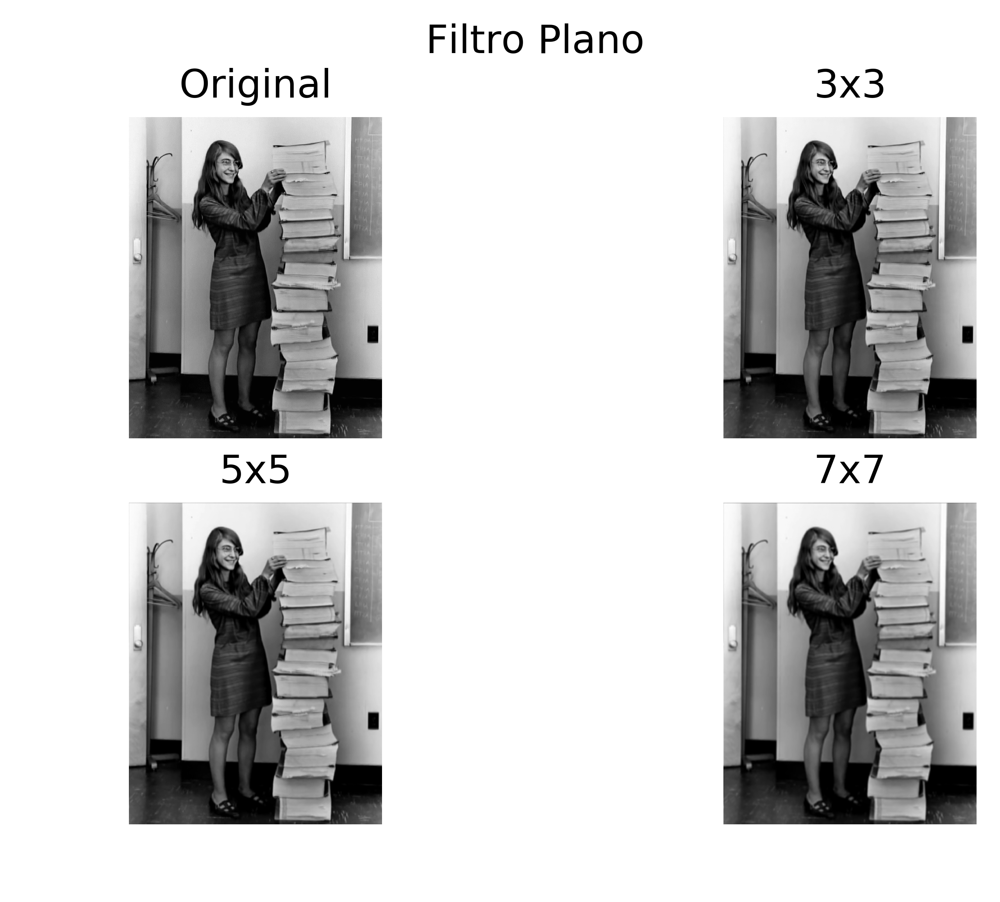

In [3]:
fig = plt.figure(dpi = 600)
fig.suptitle('Filtro Plano')

ax = plt.subplot(2,2,1)
ax.imshow(imag_gray, cmap='gray')
plt.title('Original')
plt.axis('off')


kernel_use = C2D.gen_kernel_plano(3)
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,2)
ax.imshow(imag_out, cmap='gray')
plt.title('3x3')
plt.axis('off')

kernel_use = C2D.gen_kernel_plano(5)
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,3)
ax.imshow(imag_out, cmap='gray')
plt.title('5x5')
plt.axis('off')

kernel_use = C2D.gen_kernel_plano(7)
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,4)
ax.imshow(imag_out, cmap='gray')
plt.title('7x7')
plt.axis('off')


plt.draw()
nom_arch = os.path.join(OUT_FOLDER,'TP5_Filtro_Plano.png')
plt.savefig(nom_arch)



plt.show()

# Filtro Bartlett

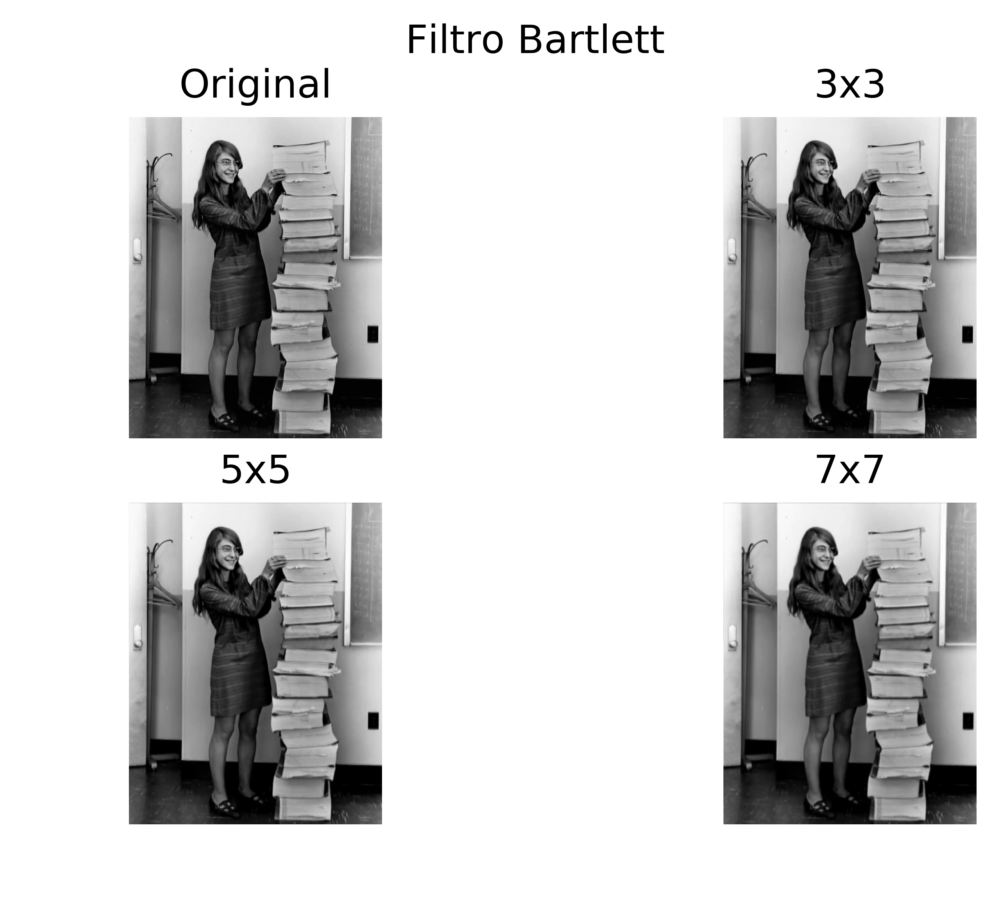

In [4]:
fig = plt.figure(dpi = 600)
fig.suptitle('Filtro Bartlett')

ax = plt.subplot(2,2,1)
ax.imshow(imag_gray, cmap='gray')
plt.title('Original')
plt.axis('off')


kernel_use = C2D.gen_kernel_Bartlett(3)
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,2)
ax.imshow(imag_out, cmap='gray')
plt.title('3x3')
plt.axis('off')

kernel_use = C2D.gen_kernel_Bartlett(5)
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,3)
ax.imshow(imag_out, cmap='gray')
plt.title('5x5')
plt.axis('off')

kernel_use = C2D.gen_kernel_Bartlett(7)
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,4)
ax.imshow(imag_out, cmap='gray')
plt.title('7x7')
plt.axis('off')

plt.draw()
nom_arch = os.path.join(OUT_FOLDER,'TP5_Filtro_Bartlett.png')
plt.savefig(nom_arch)

plt.show()

# Filtro Gauss

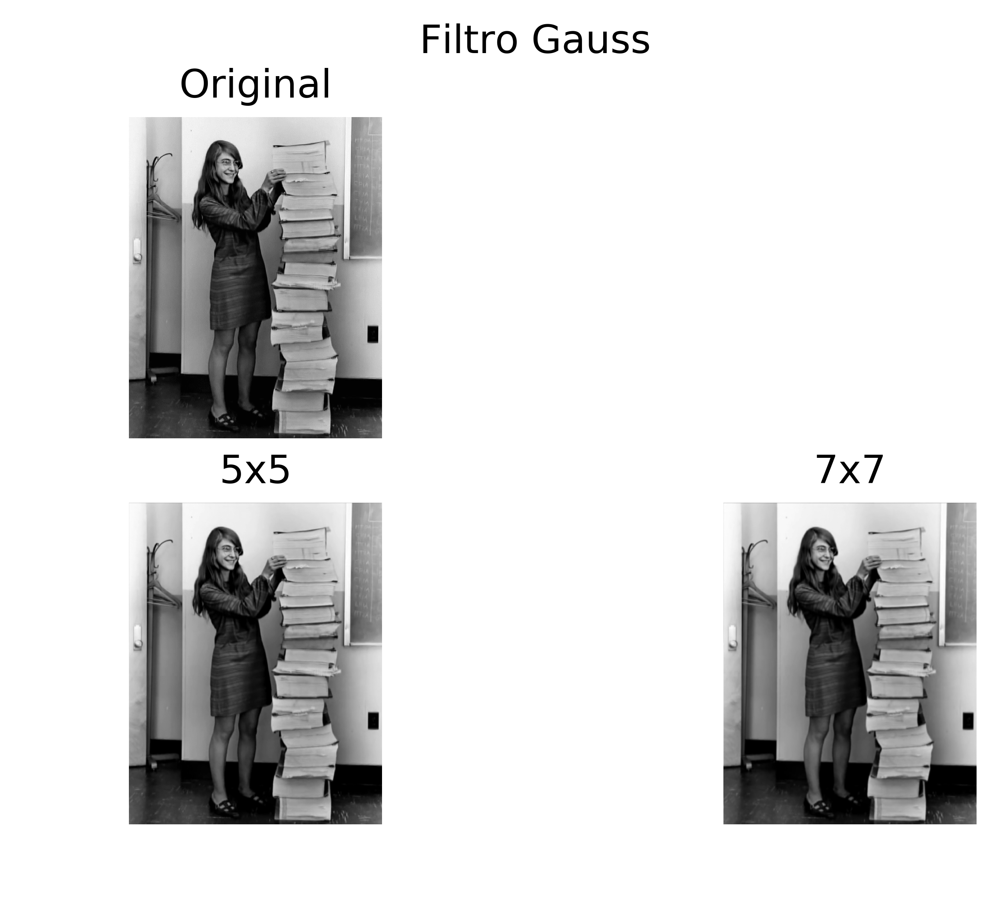

In [5]:
fig = plt.figure(dpi = 600)
fig.suptitle('Filtro Gauss')

ax = plt.subplot(2,2,1)
ax.imshow(imag_gray, cmap='gray')
plt.title('Original')
plt.axis('off')


kernel_use = C2D.gen_kernel_Bartlett(5)
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,3)
ax.imshow(imag_out, cmap='gray')
plt.title('5x5')
plt.axis('off')

kernel_use = C2D.gen_kernel_Bartlett(7)
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,4)
ax.imshow(imag_out, cmap='gray')
plt.title('7x7')
plt.axis('off')

plt.draw()
nom_arch = os.path.join(OUT_FOLDER,'TP5_Filtro_Gauss.png')
plt.savefig(nom_arch)

plt.show()

# Filtro Laplasiano

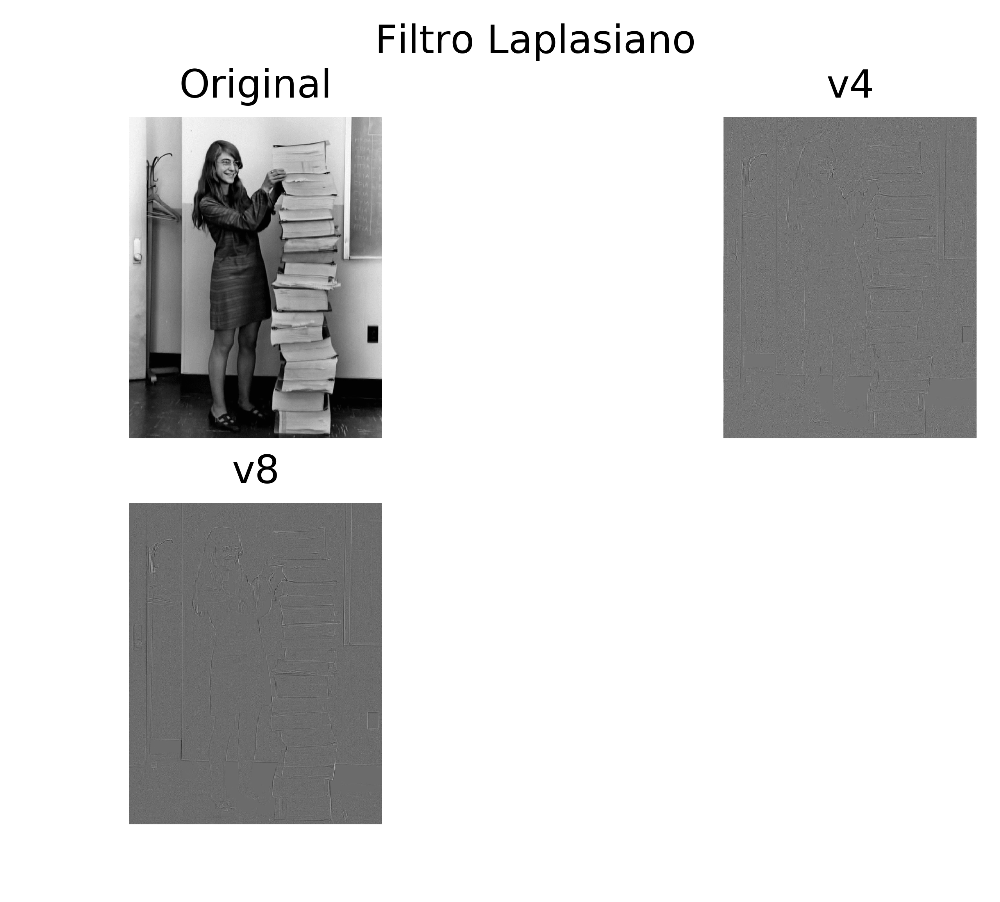

In [6]:
fig = plt.figure(dpi = 600)
fig.suptitle('Filtro Laplasiano')

ax = plt.subplot(2,2,1)
ax.imshow(imag_gray, cmap='gray')
plt.title('Original')
plt.axis('off')


kernel_use = C2D.gen_kernel_Laplaciano('v4')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,2)
ax.imshow(imag_out, cmap='gray')
plt.title('v4')
plt.axis('off')

kernel_use = C2D.gen_kernel_Laplaciano('v8')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,3)
ax.imshow(imag_out, cmap='gray')
plt.title('v8')
plt.axis('off')

plt.draw()
nom_arch = os.path.join(OUT_FOLDER,'TP5_Filtro_Laplasiano.png')
plt.savefig(nom_arch)



plt.show()

# Sobel Ortogonal

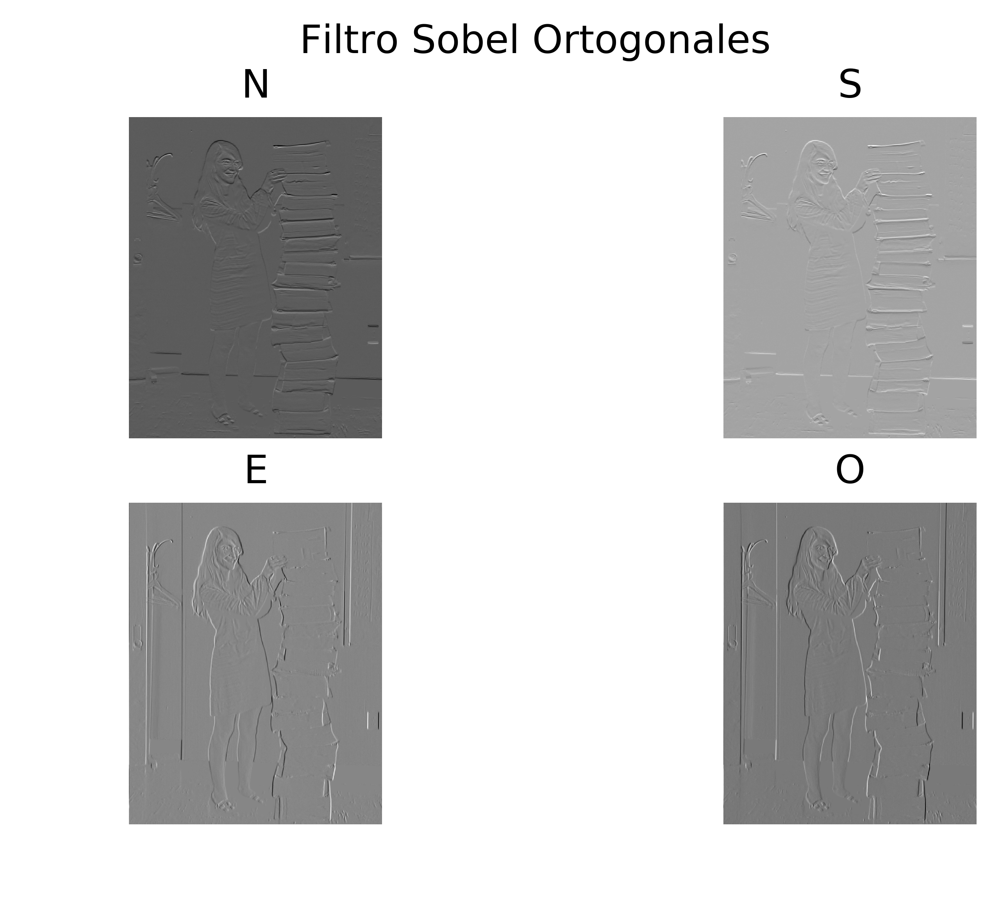

In [7]:
fig = plt.figure(dpi = 600)
fig.suptitle('Filtro Sobel Ortogonales')


kernel_use = C2D.gen_kernel_Sobel('N')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,1)
ax.imshow(imag_out, cmap='gray')
plt.title('N')
plt.axis('off')


kernel_use = C2D.gen_kernel_Sobel('S')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,2)
ax.imshow(imag_out, cmap='gray')
plt.title('S')
plt.axis('off')

kernel_use = C2D.gen_kernel_Sobel('E')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,3)
ax.imshow(imag_out, cmap='gray')
plt.title('E')
plt.axis('off')

kernel_use = C2D.gen_kernel_Sobel('O')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,4)
ax.imshow(imag_out, cmap='gray')
plt.title('O')
plt.axis('off')

plt.draw()
nom_arch = os.path.join(OUT_FOLDER,'TP5_Filtro_Sobel_Ortogonales.png')
plt.savefig(nom_arch)


plt.show()

# Sobel Diagonal

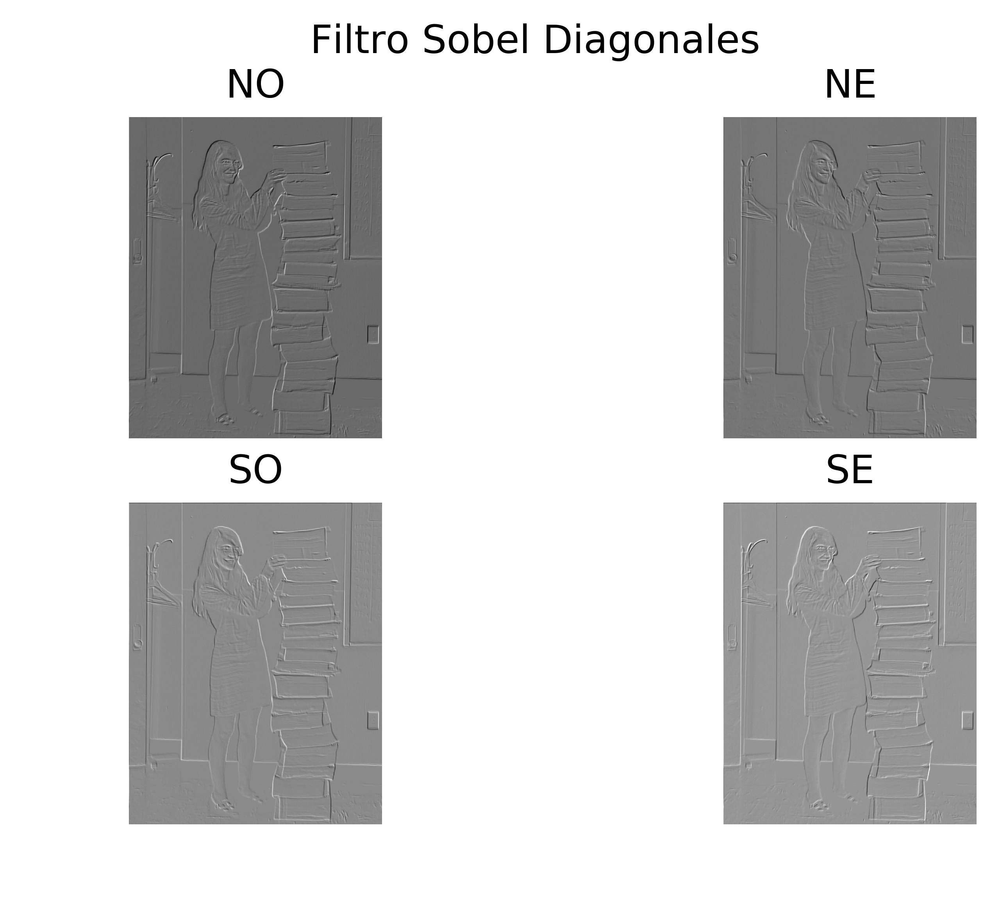

In [8]:
fig = plt.figure(dpi = 600)
fig.suptitle('Filtro Sobel Diagonales')

kernel_use = C2D.gen_kernel_Sobel('NO')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,1)
ax.imshow(imag_out, cmap='gray')
plt.title('NO')
plt.axis('off')


kernel_use = C2D.gen_kernel_Sobel('NE')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,2)
ax.imshow(imag_out, cmap='gray')
plt.title('NE')
plt.axis('off')

kernel_use = C2D.gen_kernel_Sobel('SO')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,3)
ax.imshow(imag_out, cmap='gray')
plt.title('SO')
plt.axis('off')

kernel_use = C2D.gen_kernel_Sobel('SE')
imag_out = C2D.conv_2D(imag_gray, kernel_use)
ax = plt.subplot(2,2,4)
ax.imshow(imag_out, cmap='gray')
plt.title('SE')
plt.axis('off')


plt.draw()
nom_arch = os.path.join(OUT_FOLDER,'TP5_Filtro_Sobel_Diagonales.png')
plt.savefig(nom_arch)

plt.show()